# Table of Contents
#### Chapter 0: Setting up 
# [Part 1: Univariate analysis](#Part-1:-Univariate-analysis) 
#### Part 2: Business questions
#### Part 3: Bi-variate analysis 
#### Part 4: Business questions 
#### Part 5: Categorical data analysis 
#### Part 6: Business questions 
#### Part 7: Dashboard (Tableau)

# Import libraries

In [9]:
from pandasql import sqldf
import pandas as pd
import numpy as np
import csv
import seaborn as sns
import  matplotlib.pyplot as plt
import re
pysqldf = lambda q: sqldf(q, globals())

# Loading Data

In [2]:
df = pd.read_csv("Automobile_data.csv", encoding='utf8')
df

,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,Cylinder_Configuration,Engine_Location,...,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,USB_Ports,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
0,1,Tata,Nano Genx,Xt,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,Tata,Nano Genx,Xe,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,Tata,Nano Genx,Emax Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,Tata,Nano Genx,Xta,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,Tata,Nano Genx,Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,783,Skoda,Octavia,Onyx 1.8 Tsi Dsg,1798.0,4.0,4.0,FWD (Front Wheel Drive),In-line,"Front, Transverse",...,Yes,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN,NaN
783,784,Skoda,Octavia,Onyx 2.0 Tdi Dsg,1968.0,4.0,4.0,FWD (Front Wheel Drive),In-line,"Front, Transverse",...,Yes,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN,NaN
784,785,Mahindra,Verito,1.5 D2,1461.0,4.0,3.0,FWD (Front Wheel Drive),In-line,"Front, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
785,786,Mahindra,Verito,1.5 D4 Bs-Iv,1461.0,4.0,3.0,FWD (Front Wheel Drive),In-line,"Front, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Reading all columns and rows

In [6]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)
df

,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,Cylinder_Configuration,Engine_Location,Fuel_System,Fuel_Tank_Capacity_litre,Fuel_Type,Height_mm,Length_mm,Width_mm,Body_Type,Doors,City_Mileage_km_litre,Highway_Mileage_km_litre,ARAI_Certified_Mileage,ARAI_Certified_Mileage_for_CNG,Kerb_Weight,Gears,Ground_Clearance,Front_Brakes,Rear_Brakes,Front_Suspension,Rear_Suspension,Front_Track,Rear_Track,Front_Tyre_&_Rim,Rear_Tyre_&_Rim,Power_Steering,Power_Windows,Power_Seats,Keyless_Entry,Power,Torque,Odometer,Speedometer,Tachometer,Tripmeter,Seating_Capacity,Seats_Material,Type,Wheelbase,Wheels_Size,Start_/_Stop_Button,12v_Power_Outlet,Audiosystem,Aux-in_Compatibility,Average_Fuel_Consumption,Basic_Warranty,Bluetooth,Boot-lid_Opener,Boot_Space_litre,CD_/_MP3_/_DVD_Player,Central_Locking,Child_Safety_Locks,Clock,Cup_Holders,Distance_to_Empty,Door_Pockets,Engine_Malfunction_Light,Extended_Warranty,FM_Radio,Fuel-lid_Opener,Fuel_Gauge,Handbrake,Instrument_Console,Low_Fuel_Warning,Minimum_Turning_Radius,Multifunction_Display,Sun_Visor,Third_Row_AC_Vents,Ventilation_System,Auto-Dimming_Rear-View_Mirror,Hill_Assist,Gear_Indicator,3_Point_Seat-Belt_in_Middle_Rear_Seat,Ambient_Lightning,Cargo/Boot_Lights,Drive_Modes,Engine_Immobilizer,High_Speed_Alert_System,Lane_Watch_Camera/_Side_Mirror_Camera,Passenger_Side_Seat-Belt_Reminder,Seat_Back_Pockets,Voice_Recognition,Walk_Away_Auto_Car_Lock,ABS_(Anti-lock_Braking_System),Headlight_Reminder,Adjustable_Headrests,Gross_Vehicle_Weight,Airbags,Door_Ajar_Warning,EBD_(Electronic_Brake-force_Distribution),Fasten_Seat_Belt_Warning,Gear_Shift_Reminder,Number_of_Airbags,Compression_Ratio,Adjustable_Steering_Column,Other_Specs,Other_specs,Parking_Assistance,Key_Off_Reminder,USB_Compatibility,Android_Auto,Apple_CarPlay,Cigarette_Lighter,Infotainment_Screen,Multifunction_Steering_Wheel,Average_Speed,EBA_(Electronic_Brake_Assist),Seat_Height_Adjustment,Navigation_System,Second_Row_AC_Vents,Tyre_Pressure_Monitoring_System,Rear_Center_Armrest,iPod_Compatibility,ESP_(Electronic_Stability_Program),Cooled_Glove_Box,Recommended_Tyre_Pressure,Heated_Seats,Turbocharger,ISOFIX_(Child-Seat_Mount),Rain_Sensing_Wipers,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,USB_Ports,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
0,1,Tata,Nano Genx,Xt,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",Injection,24.0,Petrol,1652,3164,1750,Hatchback,5.0,23.60,NaN,23.6 km/litre,NaN,660 kg,4,180 mm,Drum,Drum,"Independent, Lower Wishbone, McPherson Strut w...","Independent, Semi Trailing arm with coil sprin...",1325 mm,1315 mm,135/70R12,155/65R12,Electric Power,Only Front Windows,NaN,Remote,38PS@5500rpm,51Nm@4000rpm,Digital,Analog,Not on offer,Yes,4.0,Fabric,Manual,2230 mm,4 B X 12,Yes,Yes,CD Player with USB & Aux-in,Yes,Yes,2 years /75000 Kms (years/distance whichever c...,Yes,Internal,110.0,Yes,Yes,Yes,Digital,Front,Yes,Front,Yes,2 years /150000 Kms (years/distance whichever ...,Yes,Internal,Digital,Manual,Analog + Digital,Yes,4.00,Yes,Driver & Front Passenger,Not Applicable,Manual Air conditioning with cooling and heating,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,Tata,Nano Genx,Xe,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",Injection,24.0,Petrol,1652,3164,1750,Hatchback,5.0,23.60,NaN,23.6 km/litre,NaN,725 kg,4,180 mm,Drum,Drum,"Independent, Lower Wishbone, McPherson Strut w...","Independent, Semi Trailing arm with coil sprin...",1325 mm,1315 mm,135/70R12,155/65R12,NaN,NaN,NaN,NaN,38PS@5500rpm,51Nm@4000rpm,Digital,Analog,Not on offer,Yes,4.0,Fabric,Manual,2230 mm,4 B X 12,NaN,Yes,Not on offer,NaN,Yes,2 years /75000 Kms (years/distance whichever c...,NaN,Internal,110.0,NaN,NaN,Yes,Digital,Front,

# Reset

In [8]:
pd.reset_option('display.max_columns')
pd.reset_option('display.max_rows')
df.head()

,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,Cylinder_Configuration,Engine_Location,...,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,USB_Ports,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
0,1,Tata,Nano Genx,Xt,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,Tata,Nano Genx,Xe,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,Tata,Nano Genx,Emax Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,Tata,Nano Genx,Xta,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,Tata,Nano Genx,Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Run data.shape

In [3]:
df.shape

(787, 139)

# Run data.info

In [231]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 787 entries, 0 to 786
Columns: 139 entries, Power_edit to Electric_Range
dtypes: float64(12), int64(4), object(123)
memory usage: 854.8+ KB


In [15]:
#20 numerical data entries

In [234]:
#deleting duplicate Other_specs as got error
df = df.drop("Other_specs", axis=1)

KeyError: "['Other_specs'] not found in axis"

# Listing column names

In [5]:
col_name = list(df.columns)
col_name

['Sl. No.',
 'Make',
 'Model',
 'Variant',
 'Displacement',
 'Cylinders',
 'Valves_Per_Cylinder',
 'Drivetrain',
 'Cylinder_Configuration',
 'Engine_Location',
 'Fuel_System',
 'Fuel_Tank_Capacity_litre',
 'Fuel_Type',
 'Height_mm',
 'Length_mm',
 'Width_mm',
 'Body_Type',
 'Doors',
 'City_Mileage_km_litre',
 'Highway_Mileage_km_litre',
 'ARAI_Certified_Mileage',
 'ARAI_Certified_Mileage_for_CNG',
 'Kerb_Weight',
 'Gears',
 'Ground_Clearance',
 'Front_Brakes',
 'Rear_Brakes',
 'Front_Suspension',
 'Rear_Suspension',
 'Front_Track',
 'Rear_Track',
 'Front_Tyre_&_Rim',
 'Rear_Tyre_&_Rim',
 'Power_Steering',
 'Power_Windows',
 'Power_Seats',
 'Keyless_Entry',
 'Power',
 'Torque',
 'Odometer',
 'Speedometer',
 'Tachometer',
 'Tripmeter',
 'Seating_Capacity',
 'Seats_Material',
 'Type',
 'Wheelbase',
 'Wheels_Size',
 'Start_/_Stop_Button',
 '12v_Power_Outlet',
 'Audiosystem',
 'Aux-in_Compatibility',
 'Average_Fuel_Consumption',
 'Basic_Warranty',
 'Bluetooth',
 'Boot-lid_Opener',
 'Boot_Sp

# Excluding Categorical Data

In [89]:
#Alternate code: num_name = list(df.select_dtypes(include =['float64','int64']).columns)
num_name = list(df.select_dtypes(exclude='object').columns)
num_name

['Sl. No.',
 'Displacement',
 'Cylinders',
 'Valves_Per_Cylinder',
 'Fuel_Tank_Capacity_litre',
 'Height_mm',
 'Length_mm',
 'Width_mm',
 'Doors',
 'City_Mileage_km_litre',
 'Highway_Mileage_km_litre',
 'Seating_Capacity',
 'Boot_Space_litre',
 'Minimum_Turning_Radius',
 'Number_of_Airbags']

In [1]:
df.head()

NameError: name 'df' is not defined

# [Part 1: Univariate analysis](#Part-1:-Univariate-analysis) 

# Run data.describe

In [7]:
df.describe(exclude = object)

,Sl. No.,Displacement,Cylinders,Valves_Per_Cylinder,Fuel_Tank_Capacity_litre,Height_mm,Length_mm,Width_mm,Doors,City_Mileage_km_litre,Highway_Mileage_km_litre,Seating_Capacity,Boot_Space_litre,Minimum_Turning_Radius,Number_of_Airbags,USB_Ports
count,787.000000,778.000000,747.000000,726.000000,768.000000,787.000000,787.000000,787.000000,785.000000,458.000000,299.000000,784.000000,656.000000,588.000000,704.000000,8.000000
mean,394.000000,1515.865039,3.824632,3.889807,46.843620,1598.471410,4150.581957,1748.161372,4.681529,17.403384,18.654783,5.394133,358.439024,5.324235,3.014205,1.875000
std,227.331623,562.367933,0.721209,0.453621,11.897565,131.977753,400.650726,110.858485,0.520476,6.360217,3.851954,1.016601,137.145321,1.037693,2.092409,0.991031
min,1.000000,72.000000,2.000000,2.000000,15.000000,1304.000000,3164.000000,1410.000000,2.000000,4.450000,7.940000,2.000000,94.000000,4.000000,1.000000,1.000000
25%,197.500000,1197.000000,3.000000,4.000000,37.000000,1510.000000,3895.000000,1695.000000,4.000000,13.300000,15.500000,5.000000,256.000000,4.900000,2.000000,1.000000
50%,394.000000,1396.500000,4.000000,4.000000,45.000000,1560.000000,3995.000000,1735.000000,5.000000,16.300000,18.190000,5.000000,347.500000,5.200000,2.000000,1.500000
75%,590.500000,1591.000000,4.000000,4.000000,55.000000,1655.000000,4445.000000,1814.000000,5.000000,20.890000,22.000000,5.000000,460.000000,5.400000,2.250000,3.000000
max,787.000000,6592.000000,12.000000,4.000000,93.000000,2670.000000,5458.000000,2218.000000,5.000000,80.000000,25.320000,16.000000,981.000000,11.700000,10.000000,3.000000


# Find Null Values of numerical data

In [8]:
null_values_column = df[num_name].isnull().sum()
null_values_column

Sl. No.                       0
Displacement                  9
Cylinders                    40
Valves_Per_Cylinder          61
Fuel_Tank_Capacity_litre     19
Height_mm                     0
Length_mm                     0
Width_mm                      0
Doors                         2
City_Mileage_km_litre       329
Highway_Mileage_km_litre    488
Seating_Capacity              3
Boot_Space_litre            131
Minimum_Turning_Radius      199
Number_of_Airbags            83
USB_Ports                   779
dtype: int64

# Dropping Data (USB Ports)

In [4]:
df= df.drop("USB_Ports", axis = 1)
df

,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,Cylinder_Configuration,Engine_Location,...,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
0,1,Tata,Nano Genx,Xt,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,Tata,Nano Genx,Xe,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,Tata,Nano Genx,Emax Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,Tata,Nano Genx,Xta,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,Tata,Nano Genx,Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,783,Skoda,Octavia,Onyx 1.8 Tsi Dsg,1798.0,4.0,4.0,FWD (Front Wheel Drive),In-line,"Front, Transverse",...,Yes,Yes,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN
783,784,Skoda,Octavia,Onyx 2.0 Tdi Dsg,1968.0,4.0,4.0,FWD (Front Wheel Drive),In-line,"Front, Transverse",...,Yes,Yes,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN
784,785,Mahindra,Verito,1.5 D2,1461.0,4.0,3.0,FWD (Front Wheel Drive),In-line,"Front, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
785,786,Mahindra,Verito,1.5 D4 Bs-Iv,1461.0,4.0,3.0,FWD (Front Wheel Drive),In-line,"Front, Transverse",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


 # Find min, max, standard deviation, outliers, mean, mode

In [5]:
def car_char(function):
    # Find the maximum value 
    max_value = df[function].max()
    print("Maximum value:", max_value)
   
    # Find the minimum value 
    min_value = df[function].min()
    print("Minimum value:", min_value)
    
    # Find the standard deviation 
    std_value = df[function].std()
    print("Standard deviation value:", std_value)
    
    # Find the mean value 
    mean_value = df[function].mean()
    print("Mean value:", mean_value)
    
    # Find the mode value 
    mode_value = df[function].mode()
    print("Mode value:", mode_value)
    
    #Find outliers (if any)
    Q1 = df[function].quantile(0.25)
    Q3 = df[function].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - (1.5 * IQR)
    upper = Q3 + (1.5 * IQR)
    #Finding the index of the outliers
    #upper_array = np.where(df[function] >= upper)[0]
    #lower_array = np.where(df[function] <= lower)[0]
    #print("Upper outliers:", upper_array)
    #print("Lower outliers:", lower_array)
    outliers = df[(df[function] < lower) | (df[function] > upper)]
    print("Outliers:",list(sorted((outliers[function]))))
    #uncomment if you want to remove outliers
    #df.drop(index=upper_array, inplace=True)
    #df.drop(index=lower_array, inplace=True)

In [6]:
car_char('Displacement')

Maximum value: 6592.0
Minimum value: 72.0
Standard deviation value: 562.3679331066791
Mean value: 1515.8650385604112
Mode value: 0    1197.0
Name: Displacement, dtype: float64
Outliers: [72.0, 72.0, 72.0, 2198.0, 2198.0, 2200.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2487.0, 2489.0, 2489.0, 2498.0, 2498.0, 2498.0, 2523.0, 2523.0, 2523.0, 2523.0, 2523.0, 2523.0, 2523.0, 2523.0, 2694.0, 2694.0, 2694.0, 2694.0, 2694.0, 2755.0, 2755.0, 2755.0, 2755.0, 2755.0, 2755.0, 2755.0, 2979.0, 2979.0, 2982.0, 2993.0, 2993.0, 2993.0, 2993.0, 2993.0, 2993.0, 2993.0, 2993.0, 2993.0, 2993.0, 2998.0, 2998.0, 2998.0, 2998.0, 2998.0, 3198.0, 4395.0, 4395.0, 4461.0, 4951.0, 6592.0]


# Loop the above

In [103]:
def car_char_loop(data):
    for column in data.columns:
        print()
        print(f'Analysis of {column}')
        print()
        # Find the maximum value 
        max_value = data[column].max()
        print("Maximum value:", max_value)
   
        # Find the minimum value 
        min_value = data[column].min()
        print("Minimum value:", min_value)
    
        # Find the standard deviation 
        std_value = data[column].std()
        print("Standard deviation value:", std_value)
    
        # Find the mean value 
        mean_value = data[column].mean()
        print("Mean value:", mean_value)
    
        # Find the mode value 
        mode_value = data[column].mode()
        print("Mode value:", mode_value)
    
        #Find outliers (if any)
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - (1.5 * IQR)
        upper = Q3 + (1.5 * IQR)
        #Finding the index of the outliers
        outliers = data[(data[column] < lower) | (data[column] > upper)]
        print("Outliers:",list(sorted((outliers[column]))))
        print()

In [104]:
car_char_loop(df[num_name])


Analysis of Sl. No.

Maximum value: 787
Minimum value: 1
Standard deviation value: 227.3316226719606
Mean value: 394.0
Mode value: 0        1
1        2
2        3
3        4
4        5
      ... 
782    783
783    784
784    785
785    786
786    787
Name: Sl. No., Length: 787, dtype: int64
Outliers: []


Analysis of Displacement

Maximum value: 6592.0
Minimum value: 72.0
Standard deviation value: 562.3679331066791
Mean value: 1515.8650385604112
Mode value: 0    1197.0
Name: Displacement, dtype: float64
Outliers: [72.0, 72.0, 72.0, 2198.0, 2198.0, 2200.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2393.0, 2487.0, 2489.0, 2489.0, 2498.0, 2498.0, 2498.0, 2523.0, 2523.0, 2523.0, 2523.0, 2523.0, 2523.0, 2523.0, 2523.0, 2694.0, 2694.0, 2694.0, 2694.0, 2694.0, 2755.0, 2755.0, 2755.0, 2755.0, 2755.0, 2755.0, 2755.0, 2979.0, 2979.0, 2982.0, 2993.0, 2993.0, 2993.0, 2993.0, 2993.0, 2993.0, 2993.0, 2993.0, 2993.0, 2993.0, 2998.0, 2998.0, 2998.0, 2998.0, 2998

# Develop function for histogram/boxplot

In [29]:
def car_plot(function):
#'why not both?'
    sns.set(style="ticks")
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.2, .9)})
    sns.boxplot(df[function], ax=ax_box)
    #sns.boxplot(df[function], ax=ax_box, showfliers = False) <-- for no outliers
    sns.histplot(data=df, x=function, ax=ax_hist)
    ax_box.set(xlabel='')
    plt.show()

    #Alt Histogram graph
    sns.set(style="ticks")
    df[function].plot(kind='hist')
    plt.title(f'Histogram of {function}')
    plt.show()

    # Create a boxplot for the column
    df[function].plot(kind='box')
    #df[function].plot(kind='box', showfliers = False) <-- for no outliers
    plt.title(f'Boxplot of {function}')
    plt.show()

C:\Users\AaronAbundo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


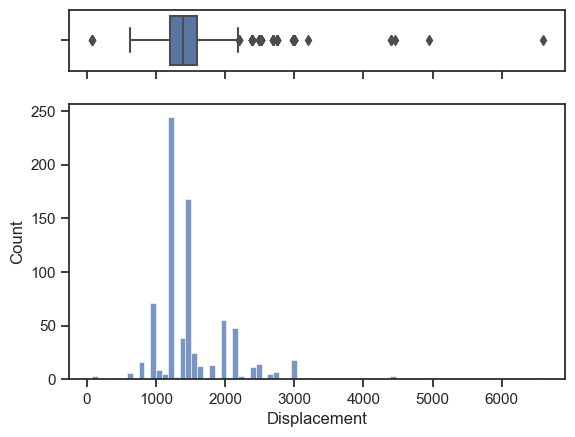

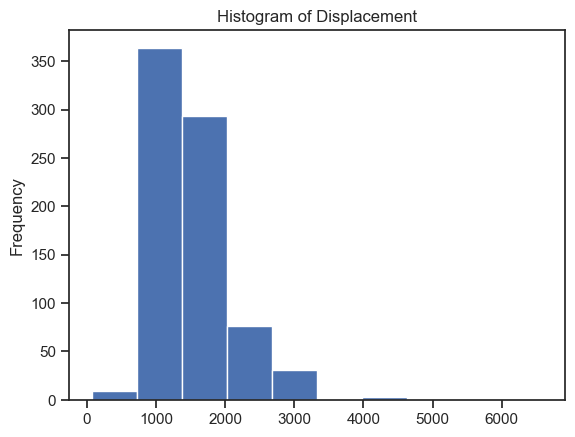

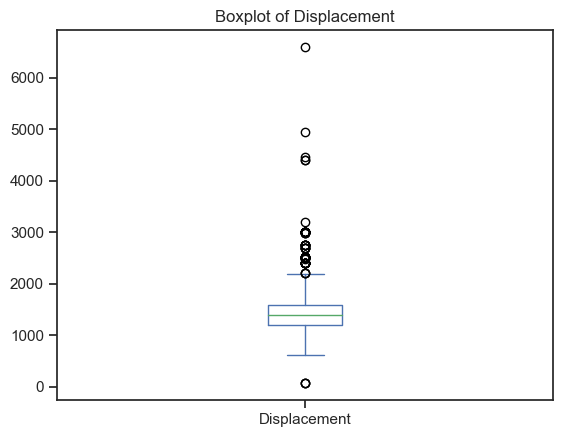

In [30]:
car_plot('Displacement')

# Loop everything

In [89]:
def car_plot_loop_of_death(data):
    # Iterate over each column in the DataFrame
    for column in data.columns:
        # Create a histogram for the column
        sns.set(style="ticks")
        data[column].plot(kind='hist')
        plt.title(f'Histogram of {column}')
        plt.show()

        # Create a boxplot for the column
        data[column].plot(kind='box')
        plt.title(f'Boxplot of {column}')
        plt.show()


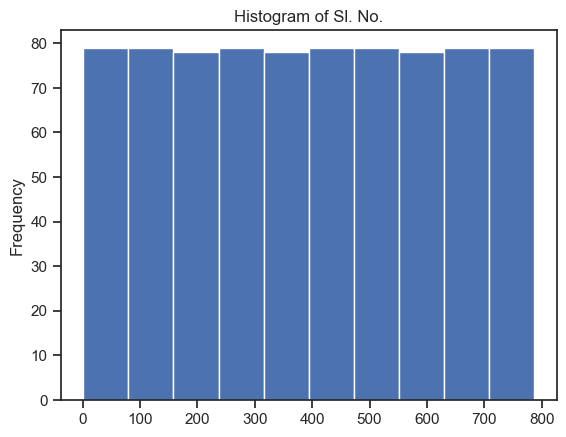

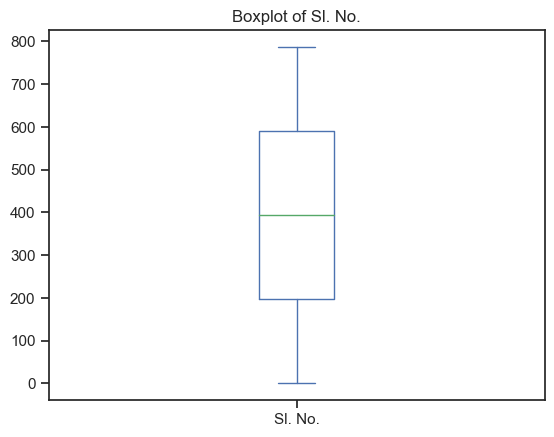

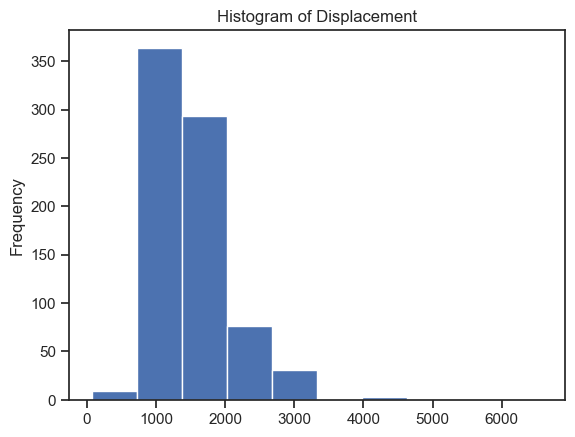

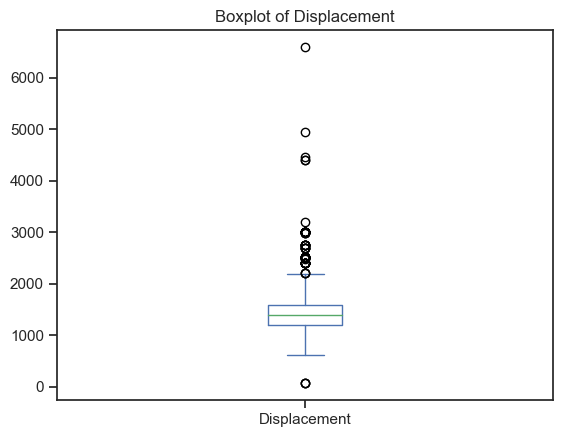

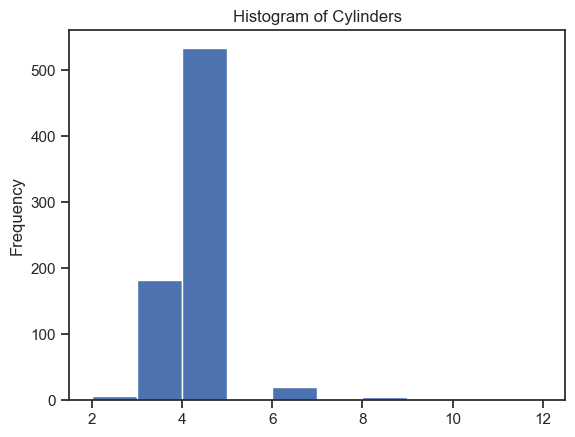

...

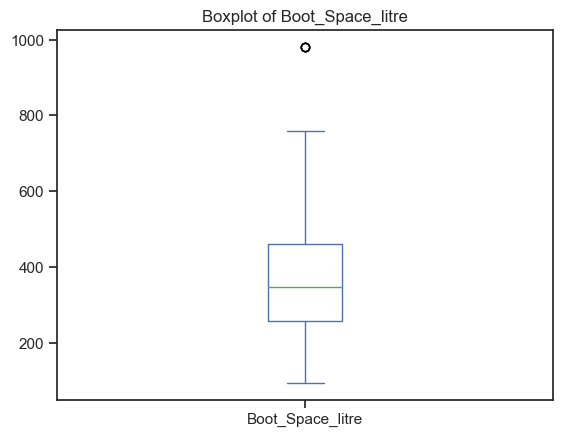

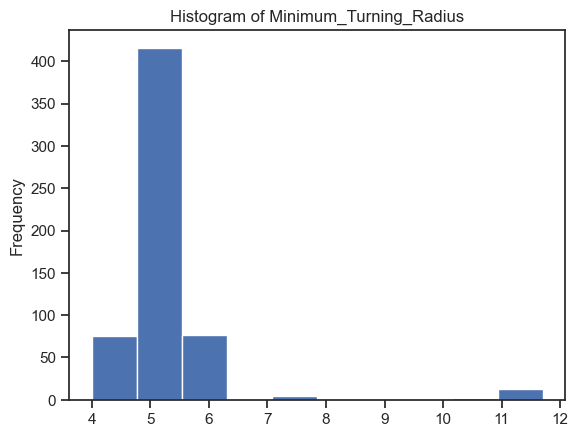

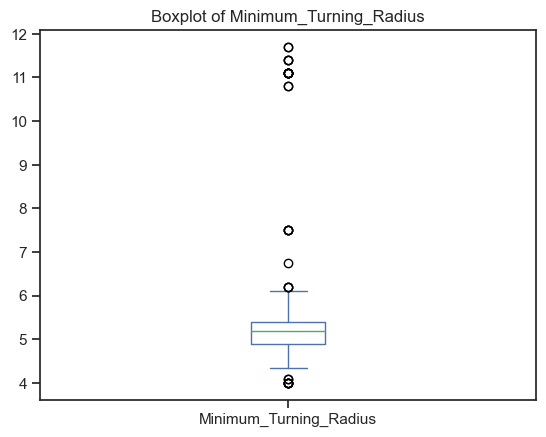

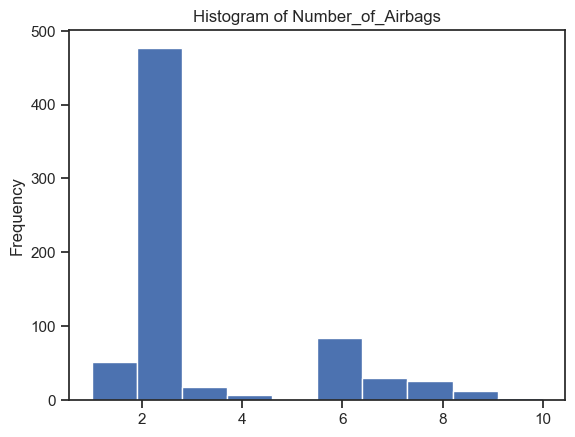

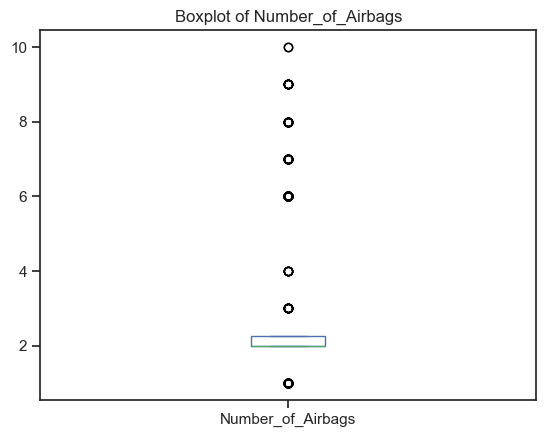

In [90]:
car_plot_loop_of_death(df[num_name])

# Part 2: Business questions

# Part 3: Bi-variate Analysis

# Heatmap

<AxesSubplot:>

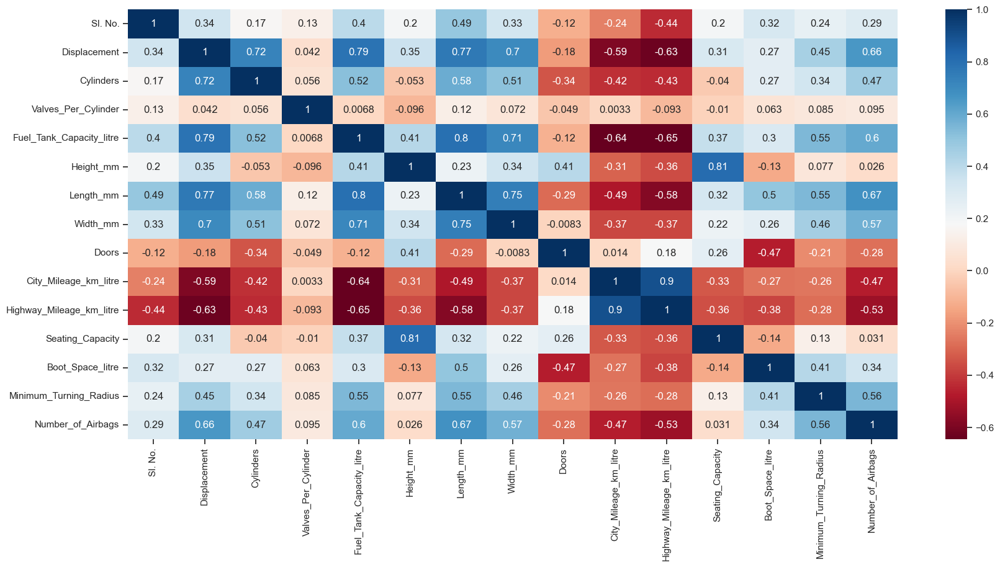

In [33]:
#Rough Bivariate Analysis
plt.figure(figsize = (20,9))
corr = df.corr()
sns.heatmap(corr, cmap ="RdBu", annot = True)

# Part 4: Buisness Questions

In [ ]:
#why doesn't height corrlate as well as length and width?

# Part 5: Categorical data Analysis

# Sorting column names

In [105]:
sorted(col_name)

['12v_Power_Outlet',
 '3_Point_Seat-Belt_in_Middle_Rear_Seat',
 'ABS_(Anti-lock_Braking_System)',
 'ARAI_Certified_Mileage',
 'ARAI_Certified_Mileage_for_CNG',
 'ASR_/_Traction_Control',
 'Adjustable_Headrests',
 'Adjustable_Steering_Column',
 'Airbags',
 'Ambient_Lightning',
 'Android_Auto',
 'Apple_CarPlay',
 'Audiosystem',
 'Auto-Dimming_Rear-View_Mirror',
 'Automatic_Headlamps',
 'Aux-in_Compatibility',
 'Average_Fuel_Consumption',
 'Average_Speed',
 'Basic_Warranty',
 'Battery',
 'Bluetooth',
 'Body_Type',
 'Boot-lid_Opener',
 'Boot_Space_litre',
 'CD_/_MP3_/_DVD_Player',
 'Cargo/Boot_Lights',
 'Central_Locking',
 'Child_Safety_Locks',
 'Cigarette_Lighter',
 'City_Mileage_km_litre',
 'Clock',
 'Compression_Ratio',
 'Cooled_Glove_Box',
 'Cruise_Control',
 'Cup_Holders',
 'Cylinder_Configuration',
 'Cylinders',
 'Displacement',
 'Distance_to_Empty',
 'Door_Ajar_Warning',
 'Door_Pockets',
 'Doors',
 'Drive_Modes',
 'Drivetrain',
 'EBA_(Electronic_Brake_Assist)',
 'EBD_(Electronic_Bra

# Sorting cateogorical data names

In [107]:
cate_name = sorted(list(df.select_dtypes(include='object').columns))
cate_name

['12v_Power_Outlet',
 '3_Point_Seat-Belt_in_Middle_Rear_Seat',
 'ABS_(Anti-lock_Braking_System)',
 'ARAI_Certified_Mileage',
 'ARAI_Certified_Mileage_for_CNG',
 'ASR_/_Traction_Control',
 'Adjustable_Headrests',
 'Adjustable_Steering_Column',
 'Airbags',
 'Ambient_Lightning',
 'Android_Auto',
 'Apple_CarPlay',
 'Audiosystem',
 'Auto-Dimming_Rear-View_Mirror',
 'Automatic_Headlamps',
 'Aux-in_Compatibility',
 'Average_Fuel_Consumption',
 'Average_Speed',
 'Basic_Warranty',
 'Battery',
 'Bluetooth',
 'Body_Type',
 'Boot-lid_Opener',
 'CD_/_MP3_/_DVD_Player',
 'Cargo/Boot_Lights',
 'Central_Locking',
 'Child_Safety_Locks',
 'Cigarette_Lighter',
 'Clock',
 'Compression_Ratio',
 'Cooled_Glove_Box',
 'Cruise_Control',
 'Cup_Holders',
 'Cylinder_Configuration',
 'Distance_to_Empty',
 'Door_Ajar_Warning',
 'Door_Pockets',
 'Drive_Modes',
 'Drivetrain',
 'EBA_(Electronic_Brake_Assist)',
 'EBD_(Electronic_Brake-force_Distribution)',
 'ESP_(Electronic_Stability_Program)',
 'Electric_Range',
 'Eng

In [118]:
#splitting categorial data and numerical data
nd = df.select_dtypes(include=[np.number]) #numerical_data
cd = df.select_dtypes(exclude=[np.number]) #categorical_data

In [115]:
nd

,Sl. No.,Displacement,Cylinders,Valves_Per_Cylinder,Fuel_Tank_Capacity_litre,Height_mm,Length_mm,Width_mm,Doors,City_Mileage_km_litre,Highway_Mileage_km_litre,Seating_Capacity,Boot_Space_litre,Minimum_Turning_Radius,Number_of_Airbags
0,1,624.0,2.0,2.0,24.0,1652,3164,1750,5.0,23.6,NaN,4.0,110.0,4.00,NaN
1,2,624.0,2.0,2.0,24.0,1652,3164,1750,5.0,23.6,NaN,4.0,110.0,4.00,NaN
2,3,624.0,2.0,2.0,15.0,1652,3164,1750,4.0,NaN,NaN,4.0,110.0,4.00,NaN
3,4,624.0,2.0,2.0,24.0,1652,3164,1750,5.0,23.6,NaN,4.0,94.0,4.00,NaN
4,5,624.0,2.0,2.0,24.0,1652,3164,1750,5.0,23.6,NaN,4.0,110.0,4.00,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,783,1798.0,4.0,4.0,50.0,1476,4670,1814,4.0,NaN,NaN,5.0,590.0,5.20,6.0
783,784,1968.0,4.0,4.0,50.0,1476,4670,1814,4.0,NaN,NaN,5.0,590.0,5.20,6.0
784,785,1461.0,4.0,3.0,50.0,1540,4277,1740,4.0,18.0,20.08,5.0,510.0,5.25,NaN
785,786,1461.0,4.0,3.0,50.0,1540,4277,1740,4.0,18.0,20.08,5.0,330.0,5.25,NaN


In [116]:
cd

,Make,Model,Variant,Drivetrain,Cylinder_Configuration,Engine_Location,Fuel_System,Fuel_Type,Body_Type,ARAI_Certified_Mileage,...,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
0,Tata,Nano Genx,Xt,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",Injection,Petrol,Hatchback,23.6 km/litre,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Tata,Nano Genx,Xe,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",Injection,Petrol,Hatchback,23.6 km/litre,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Tata,Nano Genx,Emax Xm,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",Injection,CNG,Hatchback,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Tata,Nano Genx,Xta,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",Injection,Petrol,Hatchback,21.9 km/litre,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Tata,Nano Genx,Xm,RWD (Rear Wheel Drive),In-line,"Rear, Transverse",Injection,Petrol,Hatchback,23.6 km/litre,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,Skoda,Octavia,Onyx 1.8 Tsi Dsg,FWD (Front Wheel Drive),In-line,"Front, Transverse",Injection,Petrol,Sedan,15.1 km/litre,...,Yes,Yes,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN
783,Skoda,Octavia,Onyx 2.0 Tdi Dsg,FWD (Front Wheel Drive),In-line,"Front, Transverse",Injection,Diesel,Sedan,19.5 km/litre,...,Yes,Yes,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN
784,Mahindra,Verito,1.5 D2,FWD (Front Wheel Drive),In-line,"Front, Transverse",Injection,Diesel,Sedan,21 km/litre,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
785,Mahindra,Verito,1.5 D4 Bs-Iv,FWD (Front Wheel Drive),In-line,"Front, Transverse",Injection,Diesel,Sedan,21 km/litre,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Analysing Catgorical data: Power

In [170]:
pow_df= df['Power'].str.split('PS|Bhp|hp|@| |b|ps|HP|ps|kW', expand=True)[0]
#pow_df = list(pow_df.sort_values(ascending=True))
list(pow_df)

['38',
 '38',
 '38',
 '38',
 '38',
 '38',
 '54',
 '54',
 '54',
 '54',
 '68',
 '68',
 '68',
 '68',
 '68',
 '68',
 '68',
 '68',
 '73',
 '74',
 '73',
 '62',
 '62',
 '68',
 '68',
 '68',
 '68',
 '59',
 '68',
 '68',
 '59',
 '69',
 '69',
 '59',
 '69',
 '69',
 '59',
 '69',
 '69',
 '86',
 '86',
 '86',
 '86',
 '86',
 '86',
 '86',
 '86',
 '68',
 '68',
 '68',
 '68',
 '68',
 '68',
 '68',
 '68',
 '83',
 '83',
 '83',
 '83',
 '83',
 '83',
 '83',
 '72',
 '72',
 '72',
 '72',
 '80',
 '80',
 '68',
 '80',
 '68',
 '68',
 '80',
 '68',
 '80',
 '68',
 '80',
 '68',
 '80',
 '68',
 '75',
 '75',
 '75',
 '75',
 '90',
 '90',
 '90',
 '90',
 '83',
 '83',
 '83',
 '81.8',
 '70',
 '71',
 '75',
 '83',
 '69',
 '84',
 '90',
 '84',
 '90',
 '84',
 '90',
 '84',
 '90',
 '83',
 '84',
 '84',
 '90',
 '83',
 '83',
 '83',
 '83',
 '83',
 '83',
 '69',
 '100',
 '75',
 '75',
 '75',
 '75',
 '76',
 '76',
 '76',
 '90',
 '90',
 '90',
 '105',
 '110',
 '84.3',
 '84.3',
 '75',
 '84.3',
 '75',
 '84.3',
 '75',
 '75',
 '84.3',
 '84.3',
 '84.3',
 

In [404]:
df.insert(0,'Power_edit', list(pow_df), True)

In [405]:
df["Power_edit"] = df['Power_edit'].astype(float)

In [406]:
#if you accidentally made multiple datasets
#df = df.drop("Power_edit", axis=1)
df

,Power_edit,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,Cylinder_Configuration,...,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
0,38.0,1,Tata,Nano Genx,Xt,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,38.0,2,Tata,Nano Genx,Xe,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,38.0,3,Tata,Nano Genx,Emax Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,38.0,4,Tata,Nano Genx,Xta,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,38.0,5,Tata,Nano Genx,Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),In-line,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,180.0,783,Skoda,Octavia,Onyx 1.8 Tsi Dsg,1798.0,4.0,4.0,FWD (Front Wheel Drive),In-line,...,Yes,Yes,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN
783,143.0,784,Skoda,Octavia,Onyx 2.0 Tdi Dsg,1968.0,4.0,4.0,FWD (Front Wheel Drive),In-line,...,Yes,Yes,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN
784,65.0,785,Mahindra,Verito,1.5 D2,1461.0,4.0,3.0,FWD (Front Wheel Drive),In-line,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
785,65.0,786,Mahindra,Verito,1.5 D4 Bs-Iv,1461.0,4.0,3.0,FWD (Front Wheel Drive),In-line,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [407]:
car_char('Power_edit')

Maximum value: 625.0
Minimum value: 25.8
Standard deviation value: 55.557880675764636
Mean value: 108.49504447268107
Mode value: 0    83.0
Name: Power_edit, dtype: float64
Outliers: [185.0, 185.0, 185.0, 185.0, 187.0, 188.0, 188.0, 190.0, 190.0, 190.0, 190.0, 190.0, 190.0, 190.0, 190.0, 192.0, 197.0, 200.0, 248.0, 248.0, 252.0, 258.0, 258.0, 262.0, 265.0, 265.0, 265.0, 265.0, 265.0, 265.0, 265.0, 265.0, 265.0, 286.0, 335.0, 340.0, 340.0, 340.0, 401.0, 410.0, 431.0, 450.0, 609.0, 625.0]


C:\Users\AaronAbundo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


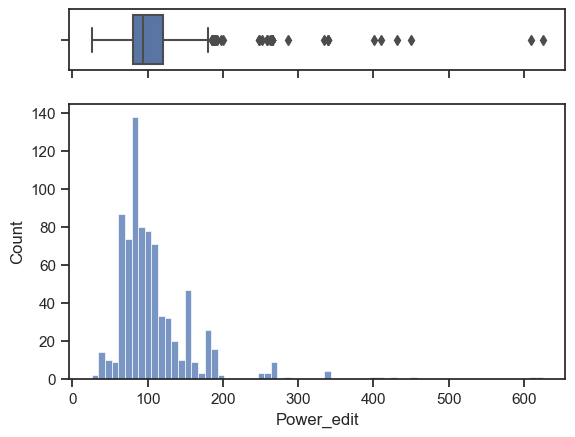

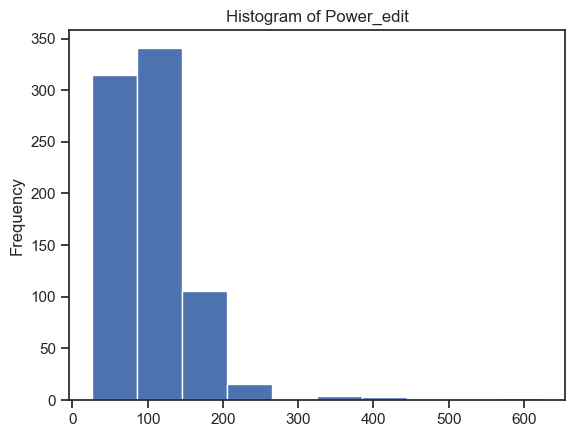

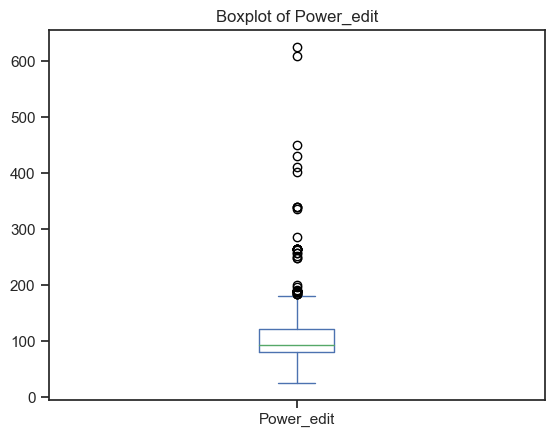

In [408]:
car_plot('Power_edit')

<AxesSubplot:>

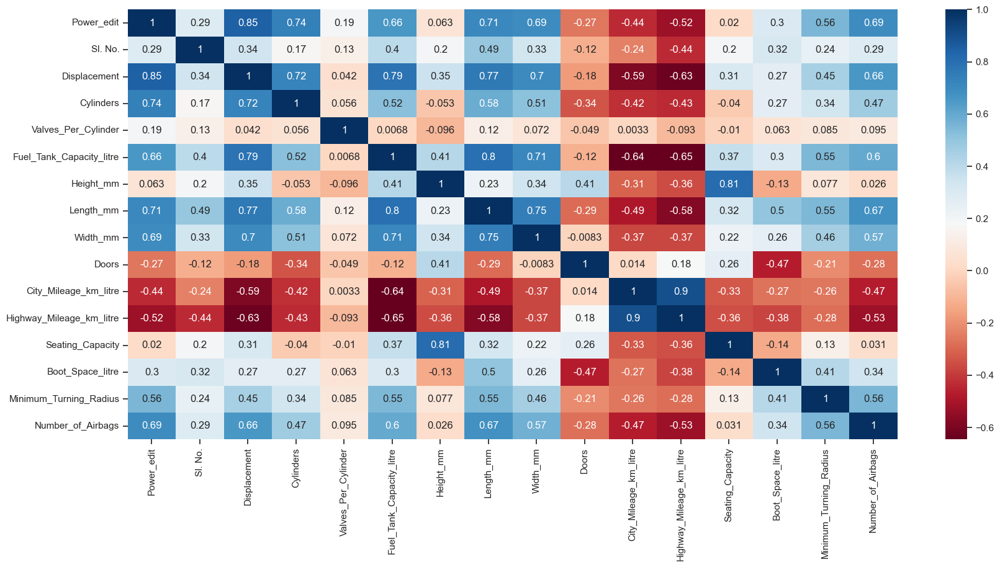

In [409]:
plt.figure(figsize = (20,9))
corr = df.corr()
sns.heatmap(corr, cmap ="RdBu", annot = True)

# Part 6: Buisness Questions

In [263]:
#which car manfacturer makes super powerful cars (Upper Outlier)

q = """SELECT
        Make, Model, Body_type
        FROM df
        WHERE Power_edit > 185.0
        GROUP BY Make, Model
        ORDER BY Power_edit DESC
"""
super_powa = pysqldf(q)
super_powa

,Make,Model,Body_Type
0,Bmw,M5,Sedan
1,Bmw,M4,Coupe
2,Bmw,M2 Competition,Coupe
3,Ford,Mustang,"Sedan, Coupe"
4,Bmw,X7,SUV
5,Bmw,6-Series,Sedan
6,Bmw,7-Series,Sedan
7,Bmw,X5,SUV
8,Toyota,Land Cruiser,SUV
9,Ford,Endeavour,SUV


In [264]:
#which car manfacturer makes super powerful cars (Upper Outlier) but worst milage

q = """SELECT
        Make, Model, Body_type
        FROM df
        WHERE Power_edit > 185.0
        GROUP BY Make, Model
        ORDER BY Highway_Mileage_km_litre
"""
super_powa = pysqldf(q)
super_powa

,Make,Model,Body_Type
0,Bmw,3-Series,Sedan
1,Bmw,6-Series,Sedan
2,Bmw,M5,Sedan
3,Bmw,X4,SUV
4,Bmw,X5,SUV
5,Bmw,X7,SUV
6,Bmw,Z4 Roadster,"Sports, Convertible"
7,Bmw,M2 Competition,Coupe
8,Toyota,Land Cruiser,SUV
9,Bmw,M4,Coupe


In [257]:
#which car manfacturers makes average (most likely manufactured the most) powerful cars

q = """SELECT
        Make, Model, Body_type
        FROM df
        WHERE Power_edit = 83
        GROUP BY Make, Model
"""
super_powa = pysqldf(q)
super_powa

,Make,Model,Body_Type
0,Hyundai,Aura,Sedan
1,Hyundai,Elite I20,Hatchback
2,Hyundai,Grand I10,Hatchback
3,Hyundai,Grand I10 Nios,Hatchback
4,Hyundai,Grand I10 Prime,Hatchback
5,Hyundai,I20 Active,Hatchback
6,Hyundai,Xcent,Sedan
7,Hyundai,Xcent Prime,Sedan
8,Suzuki,Baleno,Hatchback
9,Suzuki,Dzire Tour,Sedan


In [256]:
#which car manfacturers makes least powerful car 

q = """SELECT
        Make, Model, Body_type
        FROM df
        WHERE Power_edit = 25.8
        GROUP BY Make, Model
"""
super_powa = pysqldf(q)
super_powa

,Make,Model,Body_Type
0,Mahindra,E2O Plus,Hatchback


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Text(0.5, 1.0, 'Scatter plot of Displacement vs Power_edit')

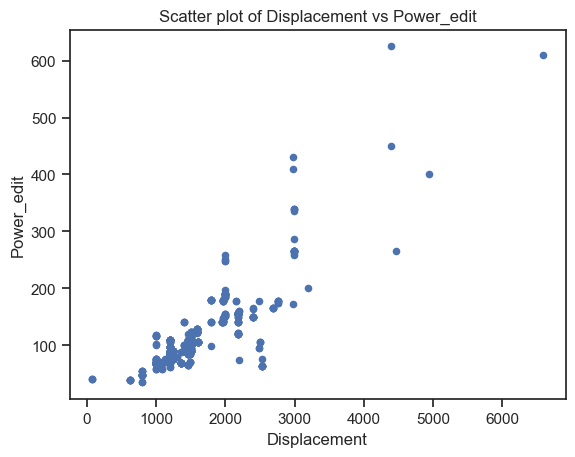

In [275]:
#considering the displacement/power high correlation, creating a scatter plot
x = 'Displacement'
y = 'Power_edit'
df.plot.scatter(x, y);
plt.title(f'Scatter plot of {x} vs {y}')

In [287]:
#looking at outlier cars where displacement roughly equals 3000
q = """SELECT
        Make, Model, Body_type
        FROM df
        WHERE Displacement <= 3100 
        AND Displacement >= 2900
        AND Power_edit >= 250
        OR Displacement >=4000
        AND Power_edit >= 600 
        GROUP BY Make, Model
"""
super_powa = pysqldf(q)
super_powa

,Make,Model,Body_Type
0,Bmw,5-Series,Sedan
1,Bmw,6-Series,Sedan
2,Bmw,7-Series,Sedan
3,Bmw,M2 Competition,Coupe
4,Bmw,M4,Coupe
5,Bmw,M5,Sedan
6,Bmw,X4,SUV
7,Bmw,X5,SUV
8,Bmw,X7,SUV
9,Bmw,Z4 Roadster,"Sports, Convertible"


# Analysing Catgorical data: Warranty

In [439]:
war_df= df['Basic_Warranty'].str.split('Years|years|yrs|Year', expand=True)[0]
war_df = war_df.str.replace("NaN", "")
war_df = war_df.str.strip()
list(war_df)

['2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 nan,
 nan,
 '2',
 '2',
 '2',
 nan,
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 nan,
 nan,
 '2',
 '2',
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 '2',
 '2',
 '2',
 '2',
 '2',
 nan,
 nan,
 nan,
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 nan,
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 '2',
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 '2',
 nan,
 '2',
 '2',
 '2',
 '2',
 '2',
 '2'

In [411]:
df.insert(0,'Warranty_edit', list(war_df), True)

In [412]:
df['Warranty_edit'] = df['Warranty_edit'].fillna(0)

In [413]:
#df = df.drop("Warranty_edit", axis=1)
df

,Warranty_edit,Power_edit,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,...,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
0,2,38.0,1,Tata,Nano Genx,Xt,624.0,2.0,2.0,RWD (Rear Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,38.0,2,Tata,Nano Genx,Xe,624.0,2.0,2.0,RWD (Rear Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,38.0,3,Tata,Nano Genx,Emax Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2,38.0,4,Tata,Nano Genx,Xta,624.0,2.0,2.0,RWD (Rear Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2,38.0,5,Tata,Nano Genx,Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,3,180.0,783,Skoda,Octavia,Onyx 1.8 Tsi Dsg,1798.0,4.0,4.0,FWD (Front Wheel Drive),...,Yes,Yes,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN
783,3,143.0,784,Skoda,Octavia,Onyx 2.0 Tdi Dsg,1968.0,4.0,4.0,FWD (Front Wheel Drive),...,Yes,Yes,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN
784,2,65.0,785,Mahindra,Verito,1.5 D2,1461.0,4.0,3.0,FWD (Front Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
785,2,65.0,786,Mahindra,Verito,1.5 D4 Bs-Iv,1461.0,4.0,3.0,FWD (Front Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [414]:
df['Warranty_edit'] = df['Warranty_edit'].astype(int)

In [415]:
car_char('Warranty_edit')

Maximum value: 8
Minimum value: 0
Standard deviation value: 1.218736907796876
Mean value: 1.6086404066073698
Mode value: 0    2
Name: Warranty_edit, dtype: int32
Outliers: [8, 8, 8]


C:\Users\AaronAbundo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


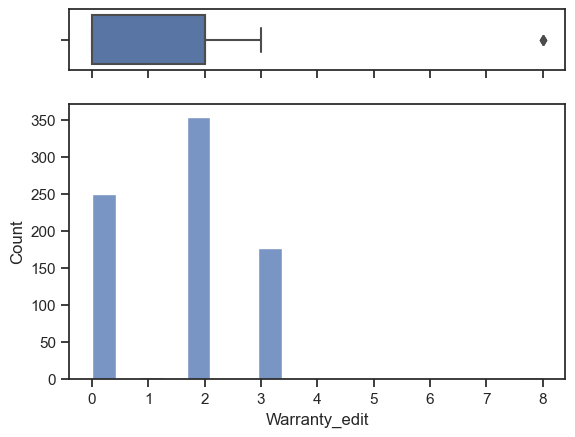

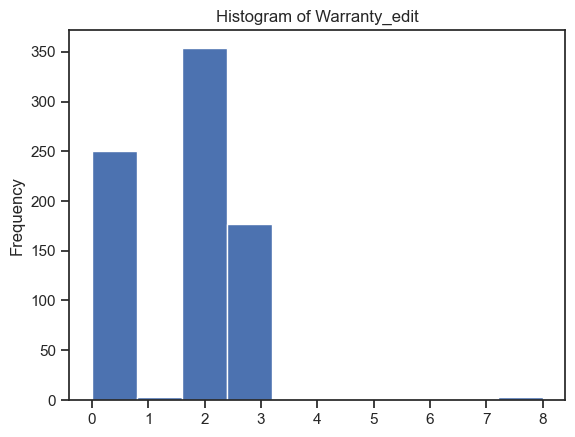

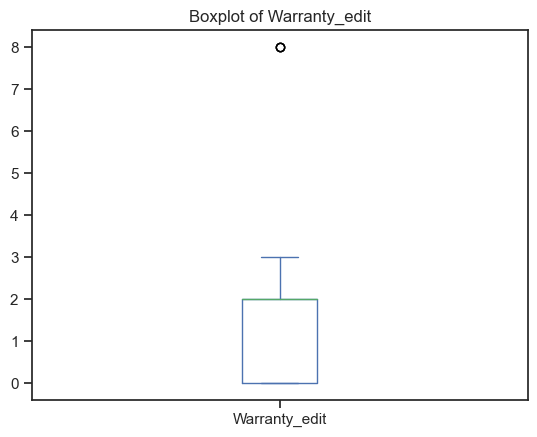

In [416]:
car_plot('Warranty_edit')

In [420]:
#which car manfacturer makes has the highest warranty

q = """SELECT
        Make, Model, Body_type
        FROM df
        WHERE Warranty_edit > 3
        GROUP BY Make, Model
"""
super_powa = pysqldf(q)
super_powa

,Make,Model,Body_Type
0,Tata,Nexon Ev,SUV


In [ ]:
#Extra notes: Tata Nexon Extra Warranty is actually 3+2 Years, so this data point is wrong

In [432]:
#which car manfacturers  have 3+ Extra Warranty
q = """SELECT Make, 
        SUM(case when  Warranty_edit >= 3 then 1 else 0 end) AS [High Warranty Cars]
        FROM df
        GROUP BY Make
"""
super_powa = pysqldf(q)
super_powa

,Make,High Warranty Cars
0,Bmw,3
1,Ford,0
2,Hyundai,35
3,Mahindra,37
4,Renault,0
5,Skoda,37
6,Suzuki,0
7,Tata,7
8,Toyota,61
9,Volkswagen,0


# Analysing Catgorical data: Ground Clearance

In [438]:
grd_df= df['Ground_Clearance'].str.split('mm', expand=True)[0]
grd_df = grd_df.str.replace("NaN", "")
grd_df = grd_df.str.strip()
list(grd_df)

['180',
 '180',
 '180',
 '180',
 '180',
 '180',
 '184',
 '184',
 '184',
 '184',
 '184',
 '184',
 '184',
 '184',
 '184',
 '184',
 '184',
 '184',
 '160',
 '160',
 '160',
 '160',
 '160',
 '160',
 '160',
 '160',
 '160',
 '160',
 '160',
 '165',
 '165',
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '180',
 '180',
 '180',
 '180',
 '180',
 '180',
 '180',
 '182',
 '182',
 '182',
 '182',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '170',
 '170',
 '170',
 '165',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 '170',
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '165',
 '163',
 '

In [448]:
df.insert(0,'grd_edit', list(grd_df), True)

In [457]:
df['grd_edit'] = df['grd_edit'].replace(0, np.NaN)

In [447]:
#df = df.drop("grd_edit", axis=1)
df

,Warranty_edit,Power_edit,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,...,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
0,2,38.0,1,Tata,Nano Genx,Xt,624.0,2.0,2.0,RWD (Rear Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,38.0,2,Tata,Nano Genx,Xe,624.0,2.0,2.0,RWD (Rear Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,38.0,3,Tata,Nano Genx,Emax Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2,38.0,4,Tata,Nano Genx,Xta,624.0,2.0,2.0,RWD (Rear Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2,38.0,5,Tata,Nano Genx,Xm,624.0,2.0,2.0,RWD (Rear Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,3,180.0,783,Skoda,Octavia,Onyx 1.8 Tsi Dsg,1798.0,4.0,4.0,FWD (Front Wheel Drive),...,Yes,Yes,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN
783,3,143.0,784,Skoda,Octavia,Onyx 2.0 Tdi Dsg,1968.0,4.0,4.0,FWD (Front Wheel Drive),...,Yes,Yes,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN
784,2,65.0,785,Mahindra,Verito,1.5 D2,1461.0,4.0,3.0,FWD (Front Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
785,2,65.0,786,Mahindra,Verito,1.5 D4 Bs-Iv,1461.0,4.0,3.0,FWD (Front Wheel Drive),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [454]:
df['grd_edit'] = df['grd_edit'].astype(int)

In [459]:
car_char('grd_edit')

Maximum value: 498.0
Minimum value: 121.0
Standard deviation value: 27.771779502275365
Mean value: 177.33178294573642
Mode value: 0    165.0
Name: grd_edit, dtype: float64
Outliers: [121.0, 124.0, 498.0, 498.0, 498.0]


C:\Users\AaronAbundo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


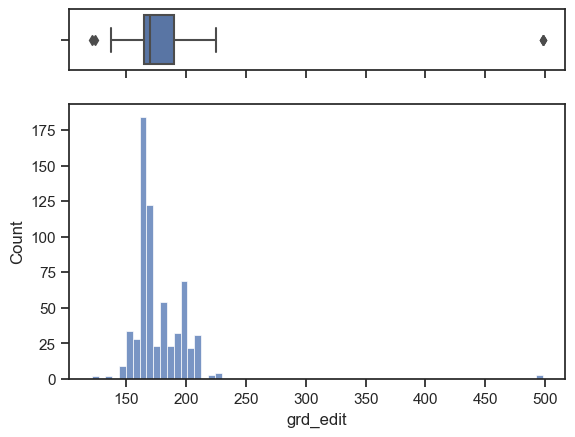

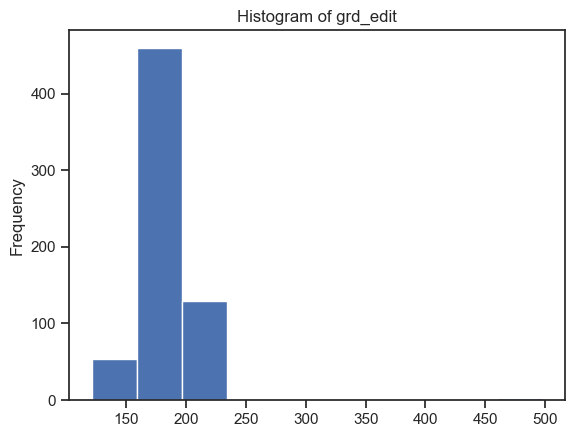

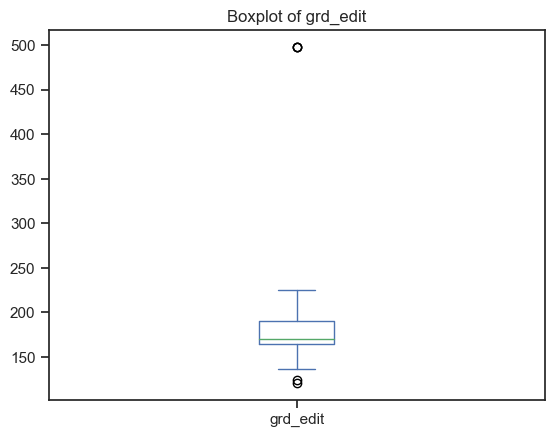

In [458]:
car_plot('grd_edit');

<AxesSubplot:>

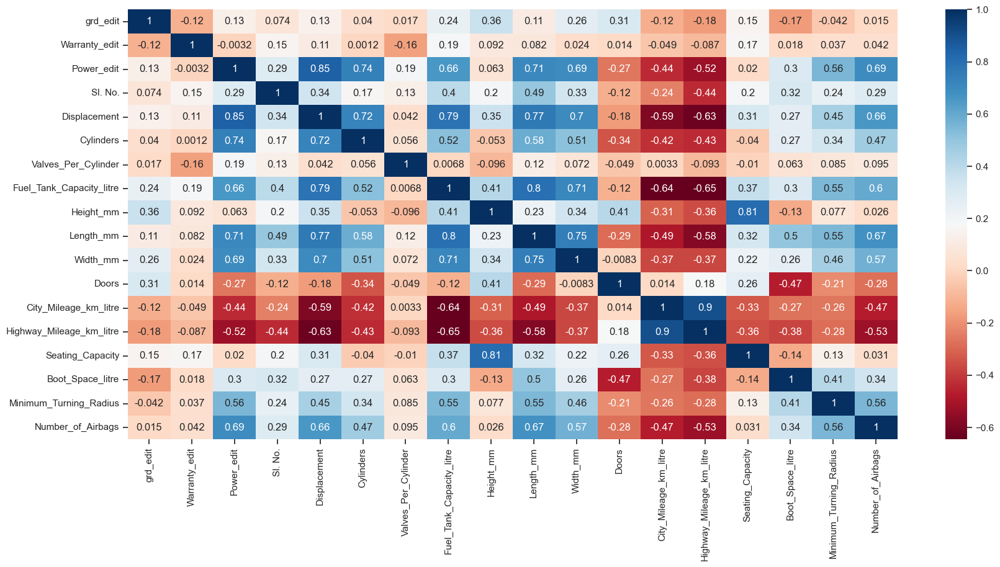

In [460]:
plt.figure(figsize = (20,9))
corr = df.corr()
sns.heatmap(corr, cmap ="RdBu", annot = True)

In [ ]:
#height/ground clearance not as correlated as I thought.

In [461]:
#which car manfacturer makes cars with high ground clearnace 

q = """SELECT
        Make, Model, Body_type
        FROM df
        WHERE grd_edit > 250
        GROUP BY Make, Model

"""
super_powa = pysqldf(q)
super_powa

,Make,Model,Body_Type
0,Bmw,X4,SUV


In [480]:
#which car manfacturer makes cars with low ground clearnace 

q = """SELECT
        Make, Model, Body_type
        FROM df
        WHERE grd_edit < 140
        GROUP BY Make, Model

"""
super_powa = pysqldf(q)
super_powa

,Make,Model,Body_Type
0,Bmw,6-Series,Coupe
1,Bmw,M4,Coupe
2,Ford,Mustang,"Sedan, Coupe"


# Analysing Catgorical data: Safety Features

In [462]:
cate_name

['12v_Power_Outlet',
 '3_Point_Seat-Belt_in_Middle_Rear_Seat',
 'ABS_(Anti-lock_Braking_System)',
 'ARAI_Certified_Mileage',
 'ARAI_Certified_Mileage_for_CNG',
 'ASR_/_Traction_Control',
 'Adjustable_Headrests',
 'Adjustable_Steering_Column',
 'Airbags',
 'Ambient_Lightning',
 'Android_Auto',
 'Apple_CarPlay',
 'Audiosystem',
 'Auto-Dimming_Rear-View_Mirror',
 'Automatic_Headlamps',
 'Aux-in_Compatibility',
 'Average_Fuel_Consumption',
 'Average_Speed',
 'Basic_Warranty',
 'Battery',
 'Bluetooth',
 'Body_Type',
 'Boot-lid_Opener',
 'CD_/_MP3_/_DVD_Player',
 'Cargo/Boot_Lights',
 'Central_Locking',
 'Child_Safety_Locks',
 'Cigarette_Lighter',
 'Clock',
 'Compression_Ratio',
 'Cooled_Glove_Box',
 'Cruise_Control',
 'Cup_Holders',
 'Cylinder_Configuration',
 'Distance_to_Empty',
 'Door_Ajar_Warning',
 'Door_Pockets',
 'Drive_Modes',
 'Drivetrain',
 'EBA_(Electronic_Brake_Assist)',
 'EBD_(Electronic_Brake-force_Distribution)',
 'ESP_(Electronic_Stability_Program)',
 'Electric_Range',
 'Eng

# The top 10 Satefy Features I want to analyse.
  'ABS_(Anti-lock_Braking_System)'
 'ASR_/_Traction_Control'
 'Multifunction_Display'
 'Auto-Dimming_Rear-View_Mirror'
 'Automatic_Headlamps'
 'Child_Safety_Locks'
  'EBA_(Electronic_Brake_Assist)'
 'Fasten_Seat_Belt_Warning'
 'High_Speed_Alert_System'
 'Tyre_Pressure_Monitoring_System'
 
 I could iterate the safety_check list

In [7]:
safety_check = ['ABS_(Anti-lock_Braking_System)',
    'ASR_/_Traction_Control',
    'Multifunction_Display',
    'Auto-Dimming_Rear-View_Mirror',
    'Automatic_Headlamps',
    'Child_Safety_Locks',
    'EBA_(Electronic_Brake_Assist)',
    'Fasten_Seat_Belt_Warning',
    'High_Speed_Alert_System',
    'Tyre_Pressure_Monitoring_System']

In [8]:
safety_check_v2 = ['ABS_(Anti-lock_Braking_System)',
    'ASR_/_Traction_Control',
    'Multifunction_Display',
    'Auto-Dimming_Rear-View_Mirror',
    'Automatic_Headlamps',
    'Child_Safety_Locks',
    'EBA_(Electronic_Brake_Assist)',
    'Fasten_Seat_Belt_Warning',
    'High_Speed_Alert_System',
    'Tyre_Pressure_Monitoring_System',
    'Engine_Malfunction_Light',
    'Central_Locking',
    'Lane_Watch_Camera/_Side_Mirror_Camera',
    'Low_Fuel_Warning',
    'Walk_Away_Auto_Car_Lock']

In [9]:
df[safety_check_v2]

,ABS_(Anti-lock_Braking_System),ASR_/_Traction_Control,Multifunction_Display,Auto-Dimming_Rear-View_Mirror,Automatic_Headlamps,Child_Safety_Locks,EBA_(Electronic_Brake_Assist),Fasten_Seat_Belt_Warning,High_Speed_Alert_System,Tyre_Pressure_Monitoring_System,Engine_Malfunction_Light,Central_Locking,Lane_Watch_Camera/_Side_Mirror_Camera,Low_Fuel_Warning,Walk_Away_Auto_Car_Lock
0,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,Yes,Yes,NaN,Yes,NaN
1,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,Yes,NaN,NaN,Yes,NaN
2,NaN,NaN,Yes,Yes,NaN,Yes,NaN,NaN,NaN,NaN,Yes,NaN,NaN,Yes,NaN
3,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,Yes,Yes,NaN,Yes,NaN
4,NaN,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,Yes,NaN,NaN,Yes,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,NaN,Yes,Yes,NaN,Yes,Yes
783,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,NaN,Yes,Yes,NaN,Yes,Yes
784,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,NaN,NaN,Yes,NaN,NaN,Yes,NaN
785,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,NaN,NaN,Yes,Yes,NaN,Yes,NaN


In [521]:
df['count_yes'] = df.apply(lambda row: row.tolist().count('Yes'), axis=1)
df['Safety_Count'] = (df[safety_check_v2] == 'Yes').sum(axis=1)

In [522]:
#df = df.drop('count_yes', axis = 1)
#df = df.drop('Safety_count', axis = 1)
df

,grd_edit,Warranty_edit,Power_edit,Sl. No.,Make,Model,Variant,Displacement,Cylinders,Valves_Per_Cylinder,...,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range,Safety_Count,count_yes
0,180.0,2,38.0,1,Tata,Nano Genx,Xt,624.0,2.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,14
1,180.0,2,38.0,2,Tata,Nano Genx,Xe,624.0,2.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,8
2,180.0,2,38.0,3,Tata,Nano Genx,Emax Xm,624.0,2.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,10
3,180.0,2,38.0,4,Tata,Nano Genx,Xta,624.0,2.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,15
4,180.0,2,38.0,5,Tata,Nano Genx,Xm,624.0,2.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,155.0,3,180.0,783,Skoda,Octavia,Onyx 1.8 Tsi Dsg,1798.0,4.0,4.0,...,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN,13,48
783,155.0,3,143.0,784,Skoda,Octavia,Onyx 2.0 Tdi Dsg,1968.0,4.0,4.0,...,Yes,NaN,Yes,Yes,NaN,NaN,NaN,NaN,13,49
784,172.0,2,65.0,785,Mahindra,Verito,1.5 D2,1461.0,4.0,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,8
785,172.0,2,65.0,786,Mahindra,Verito,1.5 D4 Bs-Iv,1461.0,4.0,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,10


In [552]:
car_char('Safety_Count')

Maximum value: 15
Minimum value: 1
Standard deviation value: 2.177144200345343
Mean value: 8.148665819567979
Mode value: 0    8
Name: Safety_Count, dtype: int64
Outliers: [1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 3, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15]


C:\Users\AaronAbundo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


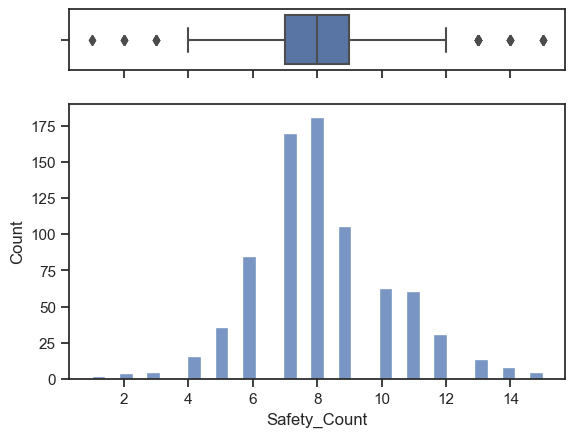

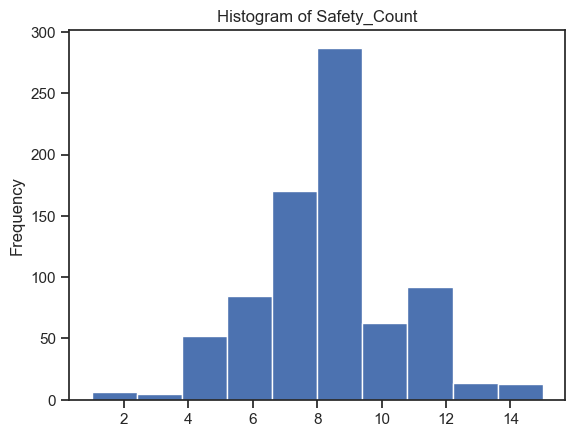

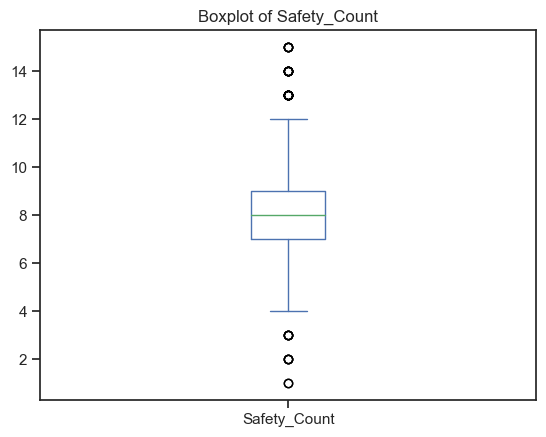

In [553]:
car_plot('Safety_Count')

In [525]:
#which cars have highest safety check list (80%)

q = """SELECT
        Make, Model, Body_type, Safety_count
        FROM df
        WHERE Safety_count >=12
        GROUP BY Make, Model
        ORDER BY Safety_count DESC

"""
super_powa = pysqldf(q)
super_powa

,Make,Model,Body_Type,Safety_Count
0,Bmw,6-Series,Sedan,15
1,Bmw,M5,Sedan,15
2,Bmw,7-Series,Sedan,14
3,Bmw,X7,SUV,14
4,Toyota,Yaris,Sedan,14
5,Bmw,3-Series,Sedan,13
6,Bmw,Z4 Roadster,"Sports, Convertible",13
7,Ford,Ecosport,SUV,13
8,Hyundai,Elantra,Sedan,13
9,Hyundai,Kona Electric,SUV,13


In [526]:
#Do all cars with safety features have leather-wrapped-steering (And if true can this be a safety feature?)

q1 = """SELECT
        Make, Model, Body_type, Safety_count, Leather_Wrapped_Steering
        FROM df
        WHERE Leather_Wrapped_Steering is NULL
        AND Safety_count >=12
        GROUP BY Make, Model
        ORDER BY Safety_count DESC

"""
super_powa2 = pysqldf(q1)
super_powa2

#So generally speaking, highly likely high cars with highest safety features will have leather_Wrapped_Steering

,Make,Model,Body_Type,Safety_Count,Leather_Wrapped_Steering
0,Skoda,Kodiaq Scout,SUV,12,None
1,Toyota,Glanza,Hatchback,12,None


In [540]:
#Worst Safety Car checks ever (20%)
q = """SELECT
        Make, Model, Body_type, Safety_count
        FROM df
        WHERE Safety_count <=3
        GROUP BY Make, Model
        ORDER BY Safety_count 

"""
super_powa = pysqldf(q)
super_powa

,Make,Model,Body_Type,Safety_Count
0,Suzuki,Gypsy,SUV,1
1,Mahindra,Bolero Power Plus,SUV,2
2,Suzuki,Omni,MPV,2
3,Mahindra,E Verito,Sedan,3
4,Mahindra,E2O Plus,Hatchback,3
5,Mahindra,Thar,SUV,3
6,Mahindra,Verito,Sedan,3


<AxesSubplot:>

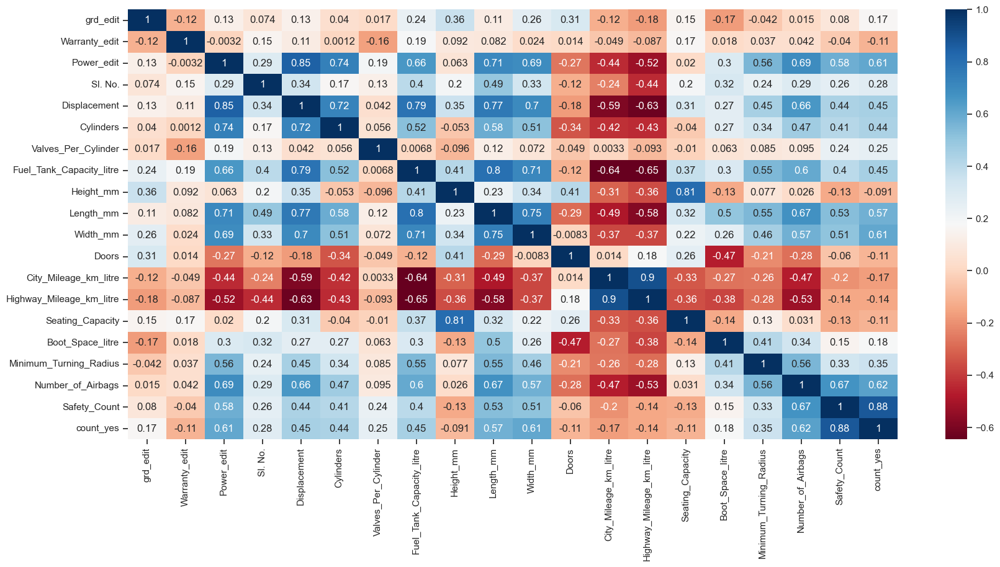

In [529]:
plt.figure(figsize = (20,9))
corr = df.corr()
sns.heatmap(corr, cmap ="RdBu", annot = True)

In [ ]:
#Why are most cars 2000 lower displacement less 4 cylinders don't have lower correlation,
#why are most cars higher then 2000 high displacement, more than 4 cylinders have higher correlation.

# Part 7: Dashboard (Tableau)

In [554]:
df.to_csv('automobile_analysis.csv', index=False)